In [1]:
import sys

%load_ext autoreload

%autoreload 2

import river.cluster as rcluster
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
from clustpy.partition import XMeans
from sklearn.cluster import KMeans, HDBSCAN
from dbhd_clustering.DBHDALGO import DBHD
from clustpy.metrics import unsupervised_clustering_accuracy, PairCountingScores
from river import metrics as rmetrics
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

from evaluate import printMetrics
from datahandler import load_data

from scipy.spatial import Voronoi, voronoi_plot_2d

(3031, 2)
3031


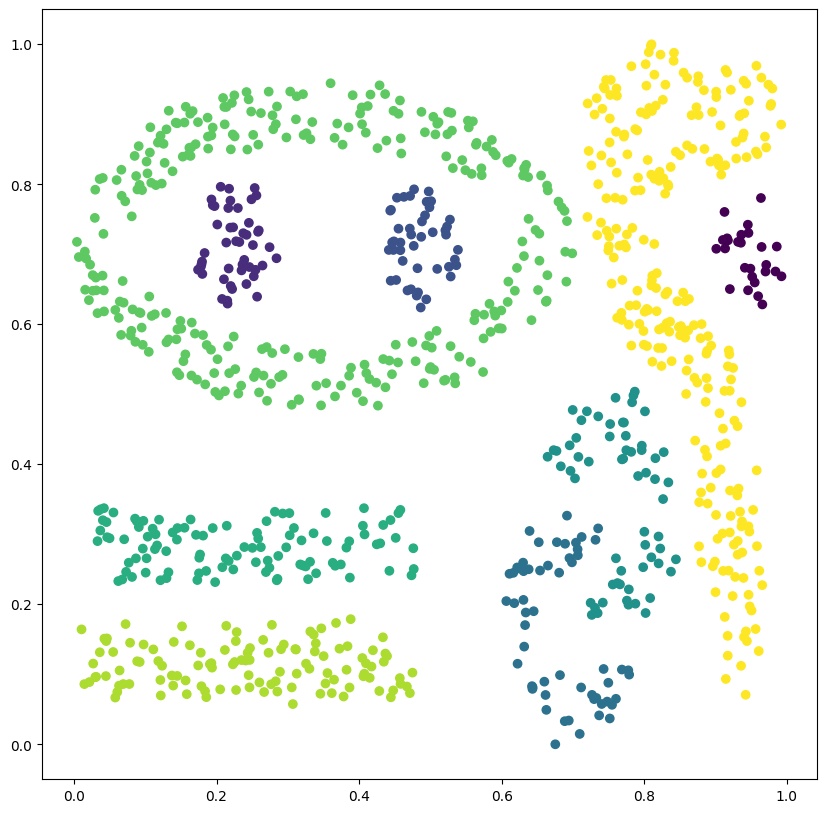

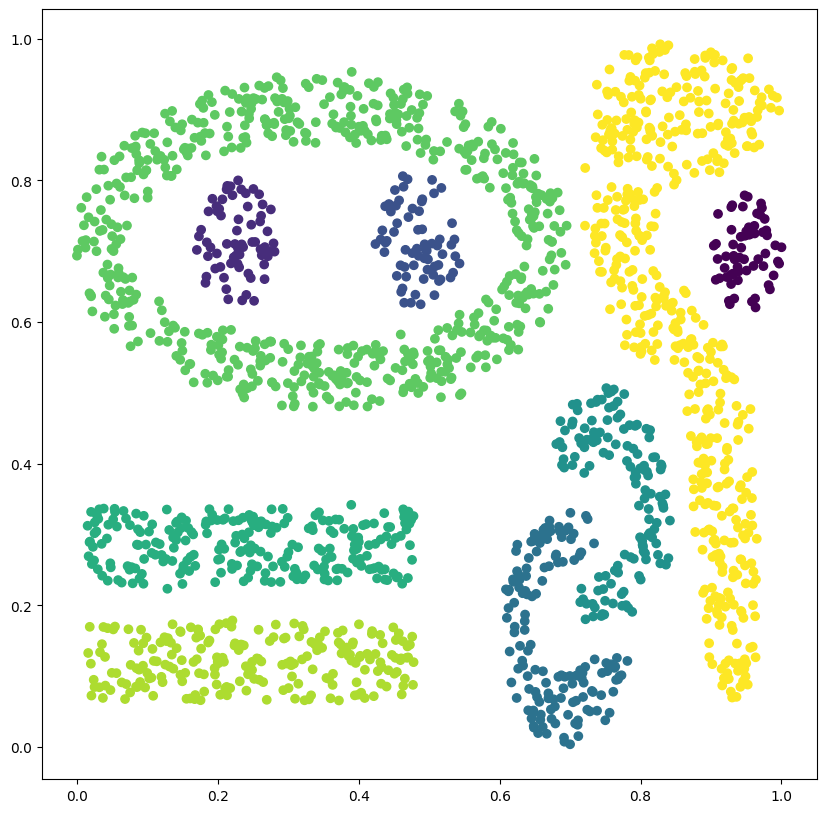

In [3]:
X, y = load_data("complex9", 2)
print(X.shape)
print(len(y))
c = 1000
X_test = X[c:]
y_test = y[c:]
X = X[:c]
y = y[:c]
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.show()
plt.figure(figsize=(10, 10))
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test)
plt.show()

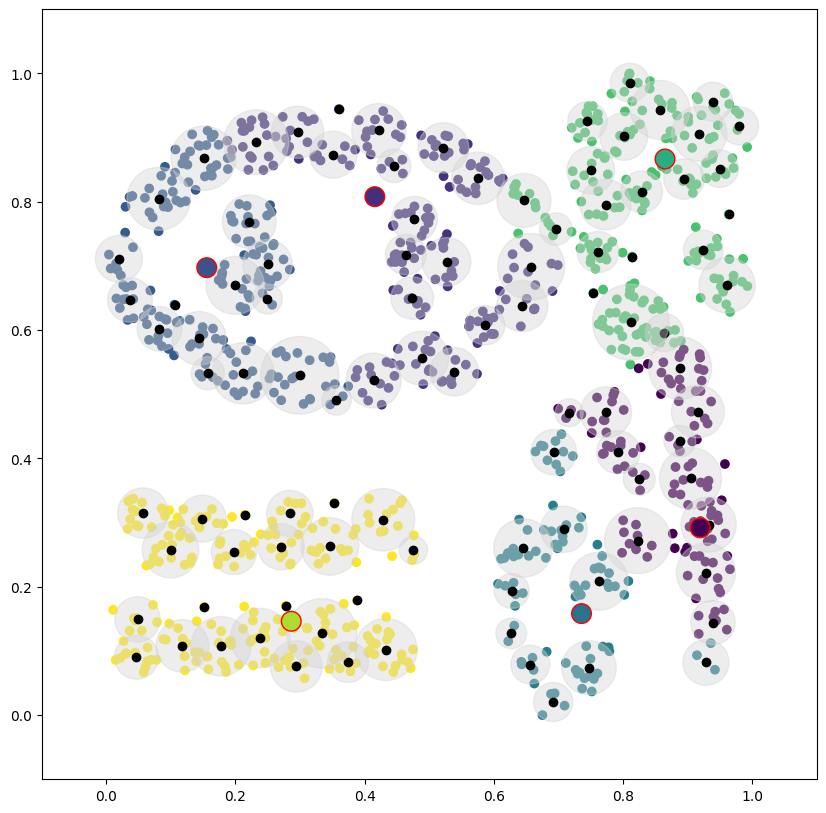

    0    1     2     3    4   5     6   7     8  
0    0     0     0    0   0    26   0     0   0  
1    0     0    47    0   0     0   0     0   0  
2    0    44     0    0   0     0   0     0   0  
3    0     0     0   57   0     0   0     0   0  
4   36     0     0   26   0     0   0     0   0  
5    0     0     0    0   0     0   0   103   0  
6    0   145   134    0   0    13   0     0   0  
7    0     0     0    0   0     0   0   114   0  
8   80     0     0    3   0   172   0     0   0  
{'accuracy': 0.571, 'ARI': 0.49971701496529564, 'NMI': 0.7035538519398055, 'AMI': 0.7001682522919802, 'completeness': 0.7350716851014901, 'fowl': 0.5910842716892998, 'homogeneity': 0.6746276895055225, 'purity': 0.702, 'F1': 0.5910317146993025, 'precision': 0.5990196950162273, 'recall': 0.5832539716895373, 'cluster_num': 6}
None


In [4]:
from utils import dict_to_np, dps_to_np
from competitors.clustream import CluStream

clustream = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
    dp = dict(enumerate(x))
    clustream.learn_one(dp)
clustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = clustream.predict_one(dp, recluster=True)
    clustream_labels_train.append(pred)

#vor = Voronoi(dps_to_np(clustream.centers.values()))
clustream_centers = dps_to_np(clustream.centers.values())
plt.figure(figsize=(10, 10))
#voronoi_plot_2d(vor, show_vertices=False, show_points=False)
plt.scatter(X[:, 0], X[:, 1], c=clustream_labels_train)
for id, mc in clustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=clustream.centers.keys(), s=200, edgecolors='red')
plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustream_labels_train))

C:\Users\Philipp-LMU\Workspaces\streaming_clustream\venvClu\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\Philipp-LMU\Workspaces\streaming_clustream\venvClu\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


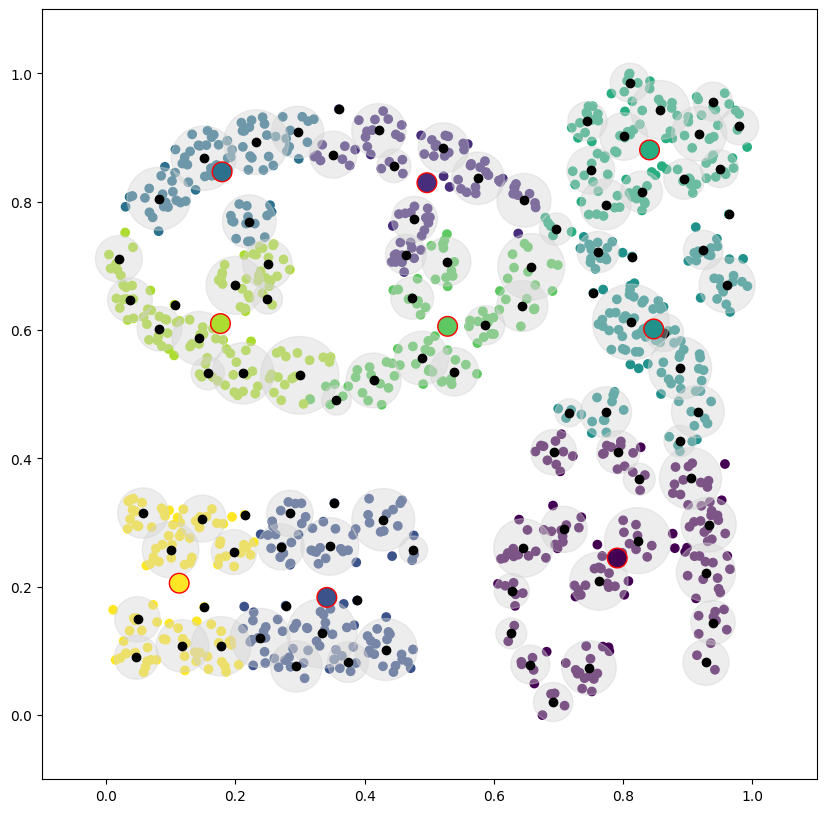

    0    1    2    3    4    5     6    7    8   
0    0    0    0    0   25     1    0    0    0  
1    0    0    0   15    0     0    0   32    0  
2    0   24    0    0    0     0   20    0    0  
3   57    0    0    0    0     0    0    0    0  
4   48    0    0    0   14     0    0    0    0  
5    0    0   49    0    0     0    0    0   54  
6    0   63    0   73    0     4   69   83    0  
7    0    0   69    0    0     0    0    0   45  
8   53    0    0    0   94   108    0    0    0  
{'accuracy': 0.442, 'ARI': 0.3328622415977419, 'NMI': 0.6099830408705419, 'AMI': 0.6035038255429723, 'completeness': 0.5712738151576293, 'fowl': 0.43959528129728914, 'homogeneity': 0.6543193930766202, 'purity': 0.67, 'F1': 0.42734140688144173, 'precision': 0.5582255728321379, 'recall': 0.3461754902385178, 'cluster_num': 9}
None


In [5]:
from competitors.clustream import CluStream

clustream2 = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
    dp = dict(enumerate(x))
    clustream2.learn_one(dp)
clustream2_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = clustream2.predict_one(dp, recluster=True, sklearn=True)
    clustream2_labels_train.append(pred)

clustream_centers = clustream2._kmeans.cluster_centers_
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustream2_labels_train)
for id, mc in clustream2.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustream2_labels_train))

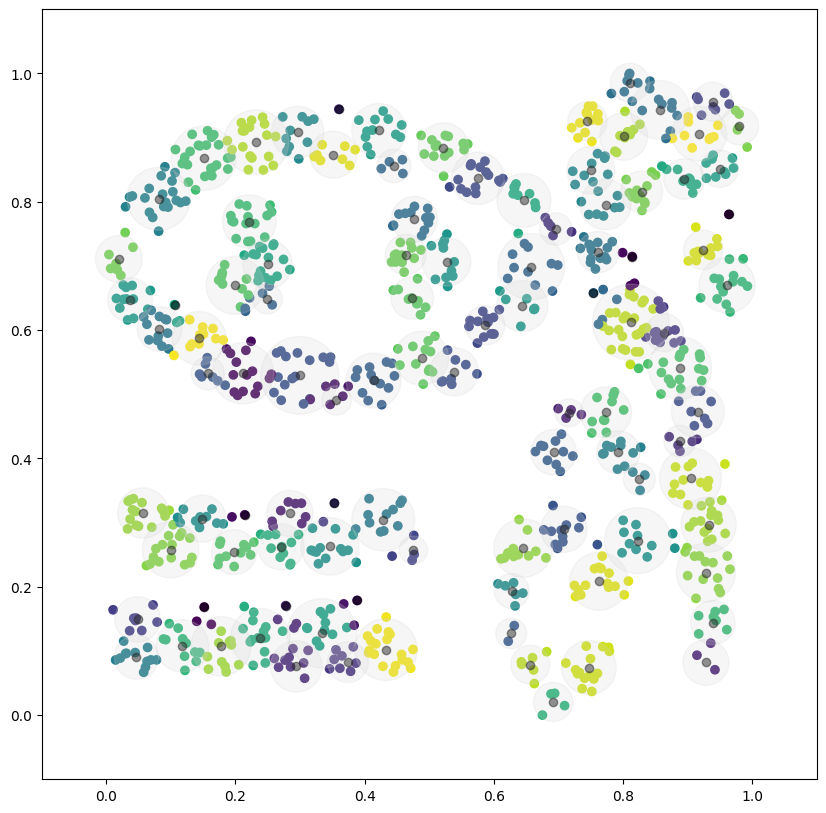

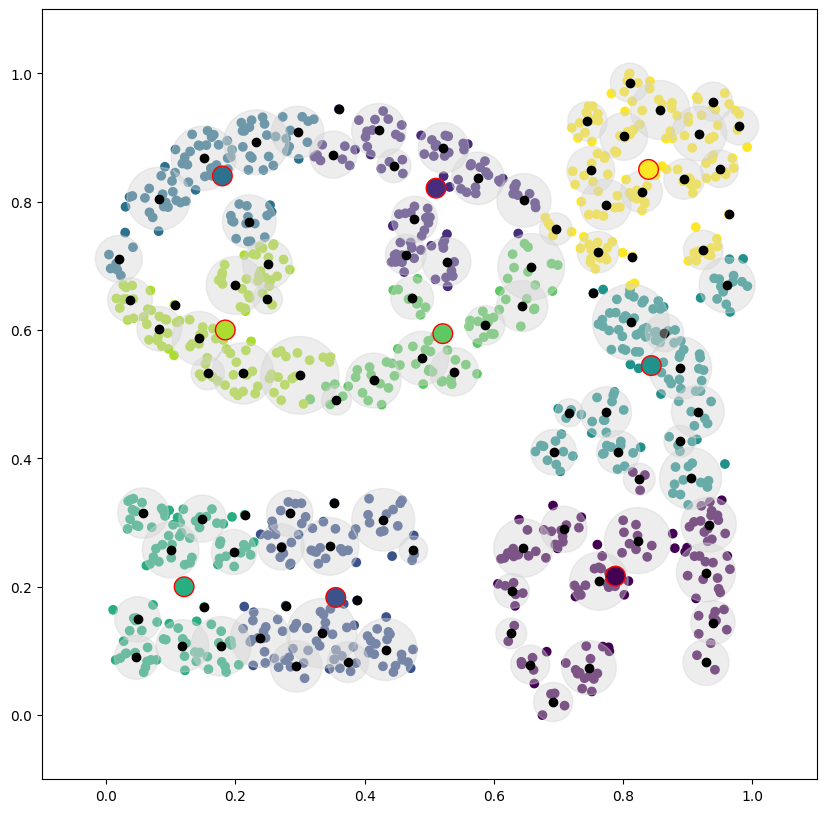

    0    1    2    3    4    5    6    7    8    
0    0    0    0    0   14    0    0    0    12  
1    0    0    0   15    0    0    0   32     0  
2    0   35    0    0    0    0    9    0     0  
3   57    0    0    0    0    0    0    0     0  
4   28    0    0    0   34    0    0    0     0  
5    0    0   49    0    0   54    0    0     0  
6    0   63    0   80    0    0   69   76     4  
7    0    0   69    0    0   45    0    0     0  
8   41    0    0    0   89    0    0    0   125  
{'accuracy': 0.486, 'ARI': 0.34568206109039346, 'NMI': 0.6095348638838421, 'AMI': 0.6030556696942638, 'completeness': 0.5704180839606471, 'fowl': 0.4508680675177785, 'homogeneity': 0.6544115486291489, 'purity': 0.682, 'F1': 0.43785602273184204, 'precision': 0.5749991199352272, 'recall': 0.35353447902688195, 'cluster_num': 9}
None


In [6]:

from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000,
                            offline_datascale=1000)

for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)

genclustream.display_store()

genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

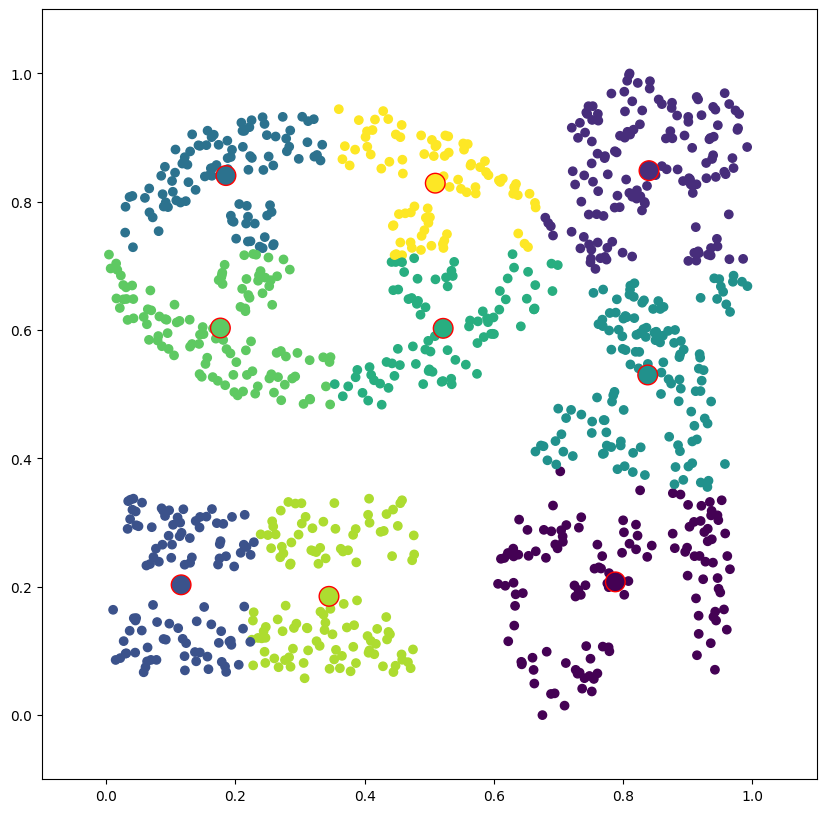

    0    1     2    3    4    5    6    7    8   
0    0    14    0    0   12    0    0    0    0  
1    0     0    0   19    0    0   28    0    0  
2    0     0    0    0    0   20    0    0   24  
3   57     0    0    0    0    0    0    0    0  
4   27     0    0    0   35    0    0    0    0  
5    0     0   54    0    0    0    0   49    0  
6    0     4    0   79    0   64   84    0   61  
7    0     0   48    0    0    0    0   66    0  
8   44   123    0    0   88    0    0    0    0  
{'accuracy': 0.466, 'ARI': 0.3399671872992141, 'NMI': 0.6034857605825327, 'AMI': 0.5969072466674347, 'completeness': 0.5647082239769674, 'fowl': 0.4458080564359504, 'homogeneity': 0.647981531097252, 'purity': 0.676, 'F1': 0.43290565633002187, 'precision': 0.5687462570895128, 'recall': 0.3494437470239384, 'cluster_num': 9}
None


In [7]:
kmeans = KMeans(n_clusters=9, random_state=0)
clustering = kmeans.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(kmeans.cluster_centers_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


74 New MC 74
100 New DP: 100, [{0: 0.7985834825154613, 1: 0.252962114537445}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 100.]
75 New MC 75
15 19
102 New MC merge: 15 + 19 -> 102 [{0: 0.40791309194829406, 1: 0.9107900146842878}, extents=+/- {0: 0.004255745846740072, 1: 0.0009985315712186527}, weight=2.0, time=Mean: 99.]
0 {0: 0.7701263157273845, 1: 0.4598367107195301} 0.0 0 [{0: 0.7701263157273845, 1: 0.4598367107195301}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 99.]
1 {0: 0.6997236566972699, 1: 0.47762936857562416} 0.0 1 [{0: 0.6997236566972699, 1: 0.47762936857562416}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 99.]
2 {0: 0.7965131196711013, 1: 0.4202290748898679} 0.0 2 [{0: 0.7965131196711013, 1: 0.4202290748898679}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 99.]
3 {0: 0.5386762654429308, 1: 0.7063400881057268} 0.0 3 [{0: 0.5386762654429308, 1: 0.7063400881057268}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 99.]
4 {0: 0.1753187385

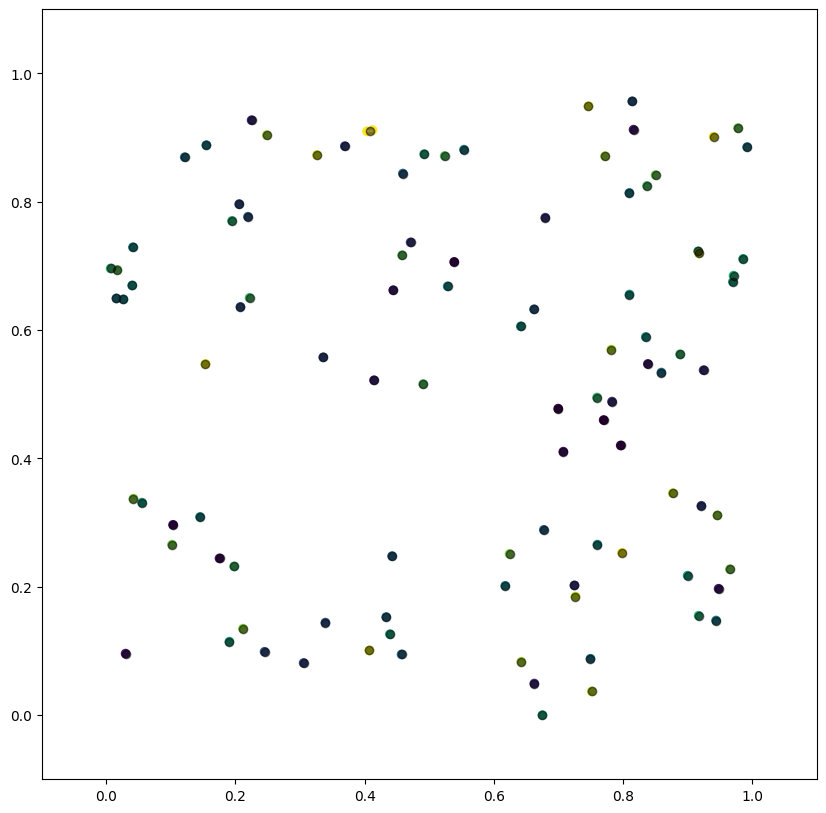

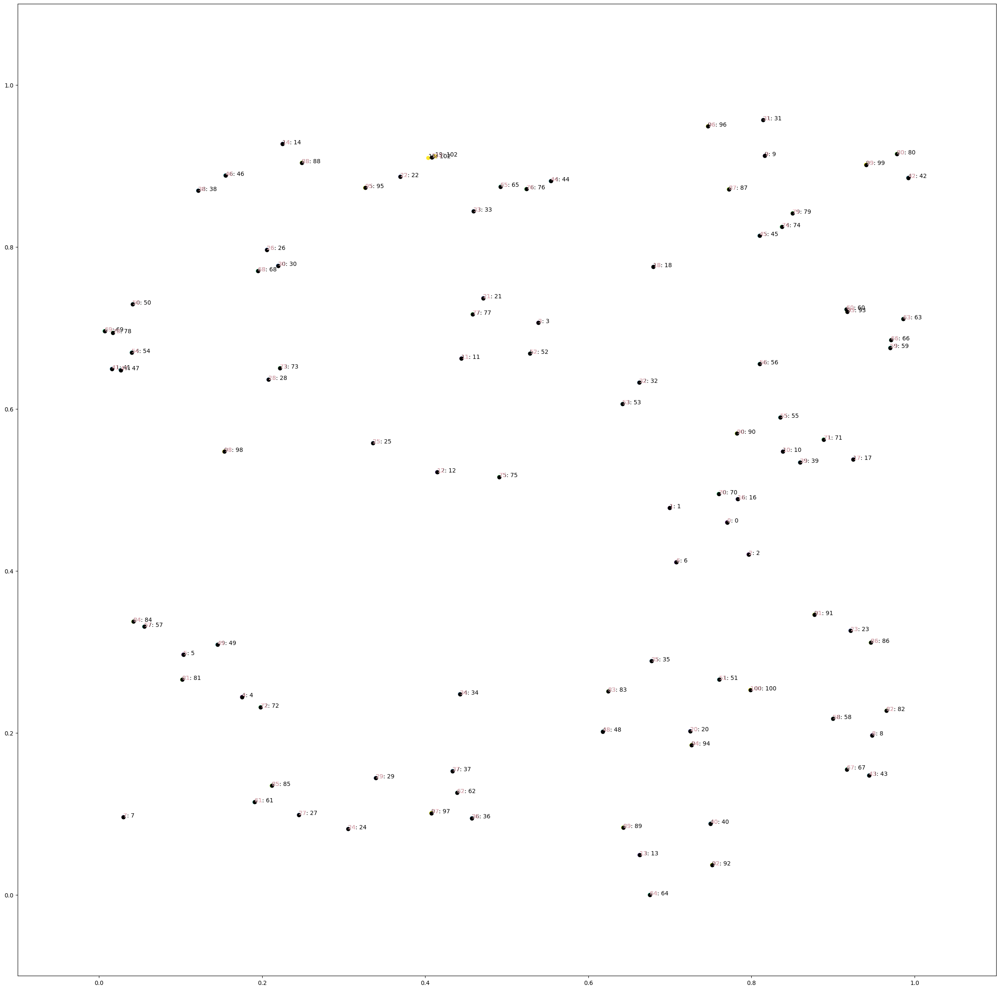

101 New DP: 103, [{0: 0.8114967071793222, 1: 0.5464787077826725}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 101.]
76 New MC 76
59 66
105 New MC merge: 59 + 66 -> 105 [{0: 0.9707413786493093, 1: 0.6801174743024962}, extents=+/- {0: 0.0005065310805111856, 1: 0.004781204111600601}, weight=2.0, time=Mean: 99.]
102 New DP: 106, [{0: 0.5787755366870065, 1: 0.8539348017621146}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 102.]
77 New MC 77
41 47
108 New MC merge: 41 + 47 -> 108 [{0: 0.021033205434849926, 1: 0.6486402349486049}, extents=+/- {0: 0.005397837031182261, 1: 0.0007083700440528307}, weight=2.0, time=Mean: 99.]
103 New DP: 109, [{0: 0.20509421330635766, 1: 0.07844933920704845}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 103.]
78 New MC 78
69 78
111 New MC merge: 69 + 78 -> 111 [{0: 0.011882467093912486, 1: 0.6949744493392069}, extents=+/- {0: 0.005152313232331872, 1: 0.0010748898678413776}, weight=2.0, time=Mean: 99.]
104 New DP: 112, [{0: 0.1810977641850

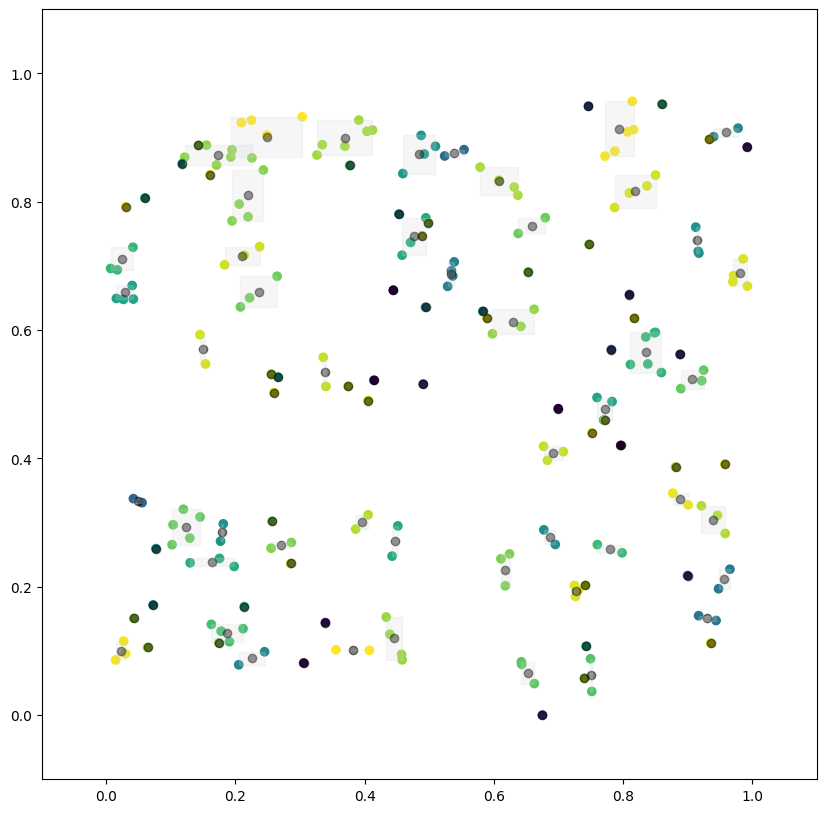

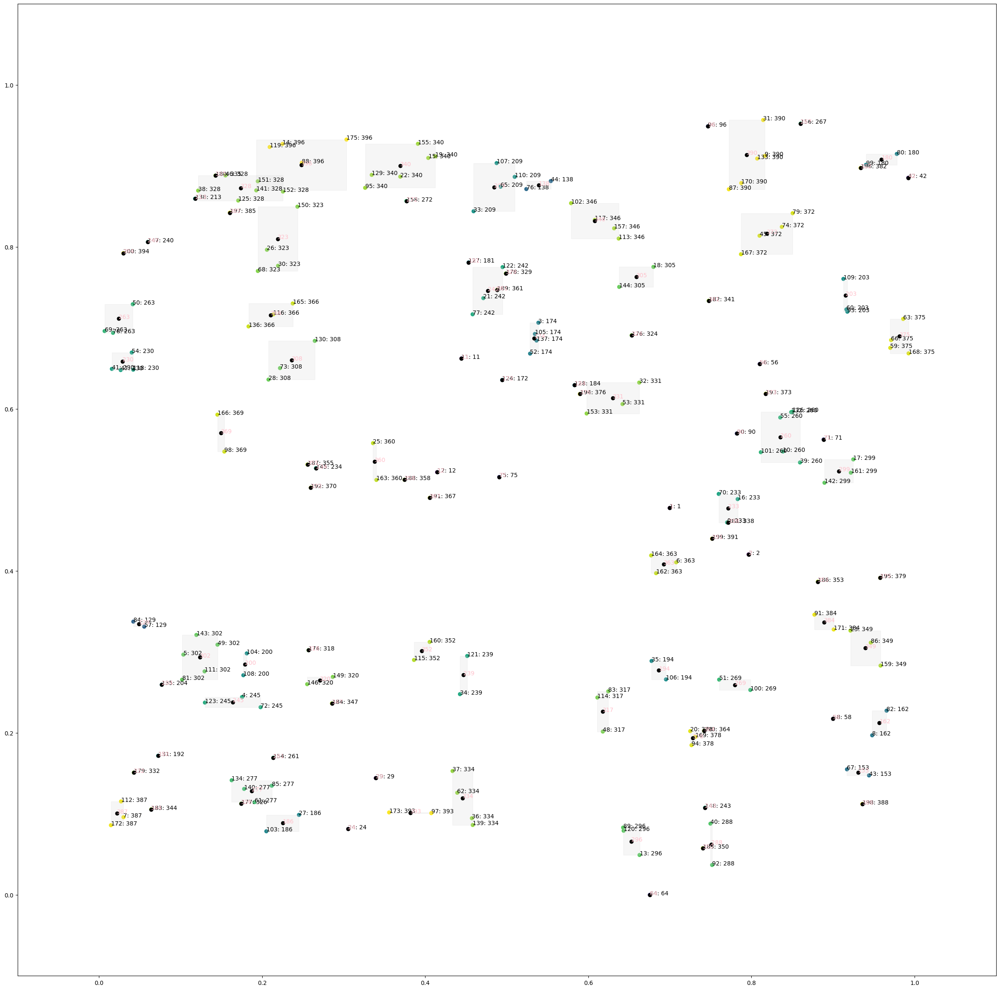

201 New DP: 397, [{0: 0.8265378047665533, 1: 0.3503177679882526}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 201.]
324 New MC 324
305 324
399 New MC merge: 305 + 324 -> 399 [{0: 0.658775743133444, 1: 0.7330466960352423}, extents=+/- {0: 0.020968322268787365, 1: 0.04219207048458151}, weight=3.0, time=Mean: 139.666667]
202 New DP: 400, [{0: 0.5720350605035524, 1: 0.8129010279001467}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 202.]
326 New MC 326
277 326
402 New MC merge: 277 + 326 -> 402 [{0: 0.1871459074943006, 1: 0.12702143906020558}, extents=+/- {0: 0.02455311719374409, 1: 0.014419970631424368}, weight=5.0, time=Mean: 129.8]
203 New DP: 403, [{0: 0.18005078582361805, 1: 0.671906020558003}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 203.]
329 New MC 329
242 329
405 New MC merge: 242 + 329 -> 405 [{0: 0.4784042280230394, 1: 0.7458936857562408}, extents=+/- {0: 0.020368890291413866, 1: 0.029124229074889874}, weight=5.0, time=Mean: 137.4]
204 New DP: 406, [{

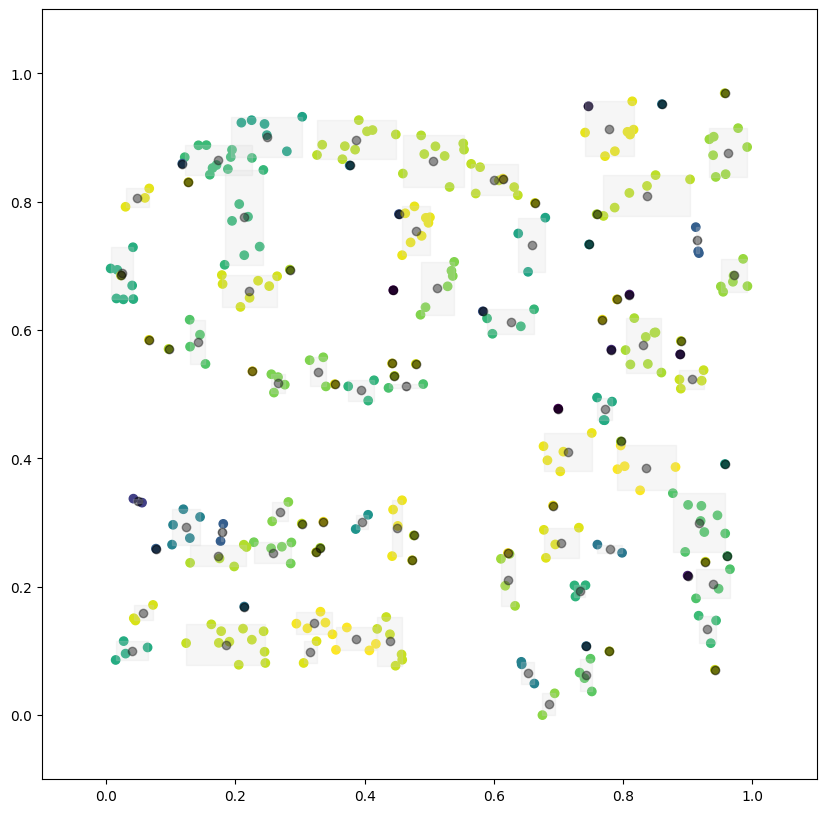

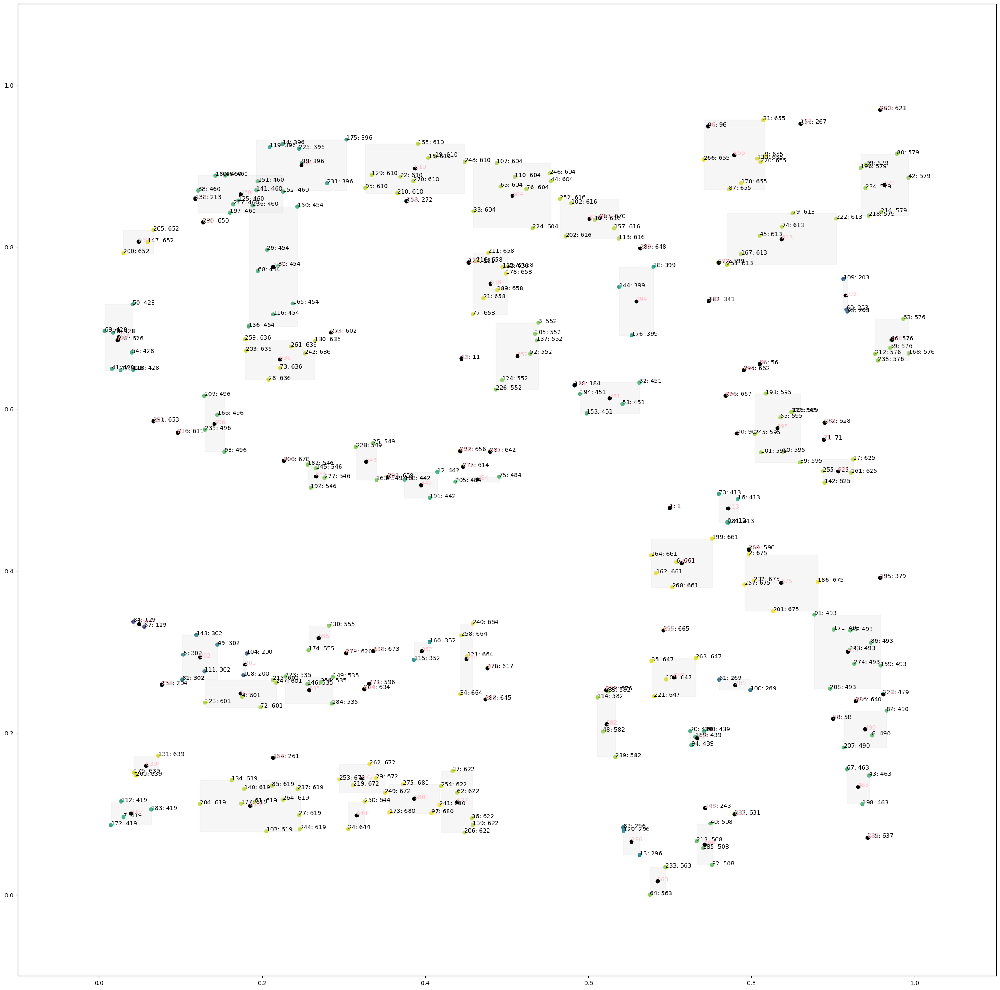

301 New DP: 681, [{0: 0.9195227548212616, 1: 0.5570466960352423}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 301.]
611 New MC 611
496 611
683 New MC merge: 496 + 611 -> 683 [{0: 0.12498341055413173, 1: 0.581728046989721}, extents=+/- {0: 0.028556703463286454, 1: 0.034457562408223175}, weight=5.0, time=Mean: 197.]
302 New DP: 684, [{0: 0.8045379876191122, 1: 0.620128046989721}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 302.]
614 New MC 614
484 614
686 New MC merge: 484 + 614 -> 686 [{0: 0.46381436336342535, 1: 0.5193116005873715}, extents=+/- {0: 0.026858681515080918, 1: 0.009353303964757698}, weight=3.0, time=Mean: 193.666667]
303 New DP: 687, [{0: 0.9316971961624556, 1: 0.717725697503671}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 303.]
617 New MC 617
535 596
689 New MC merge: 535 + 596 -> 689 [{0: 0.27985215485842196, 1: 0.25288105726872245}, extents=+/- {0: 0.051341017073120374, 1: 0.01657679882525695}, weight=6.0, time=Mean: 204.833333]
304 New DP: 6

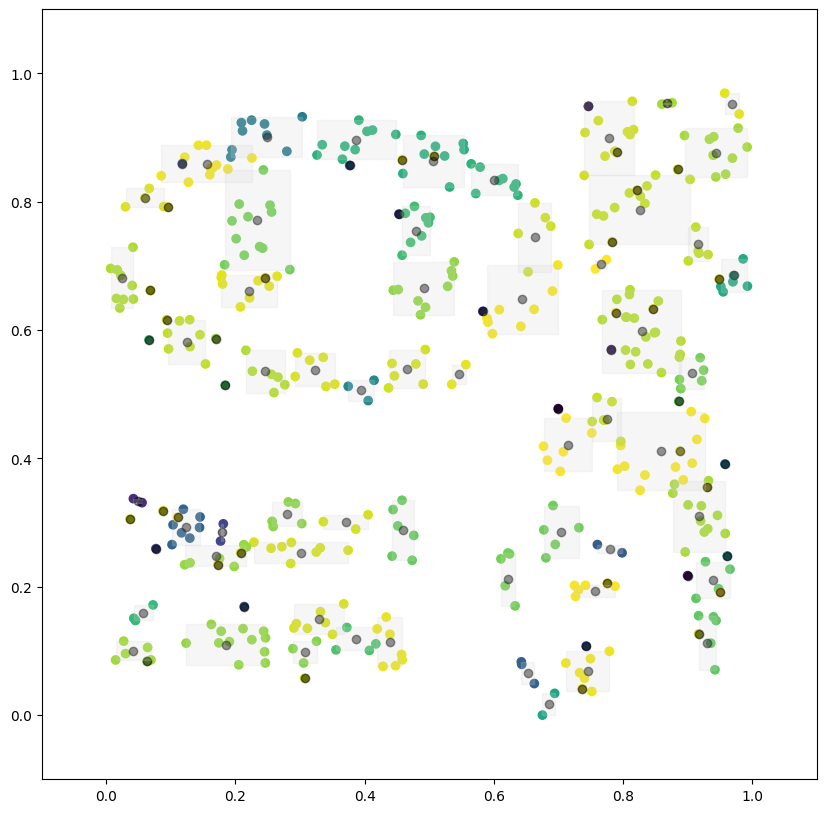

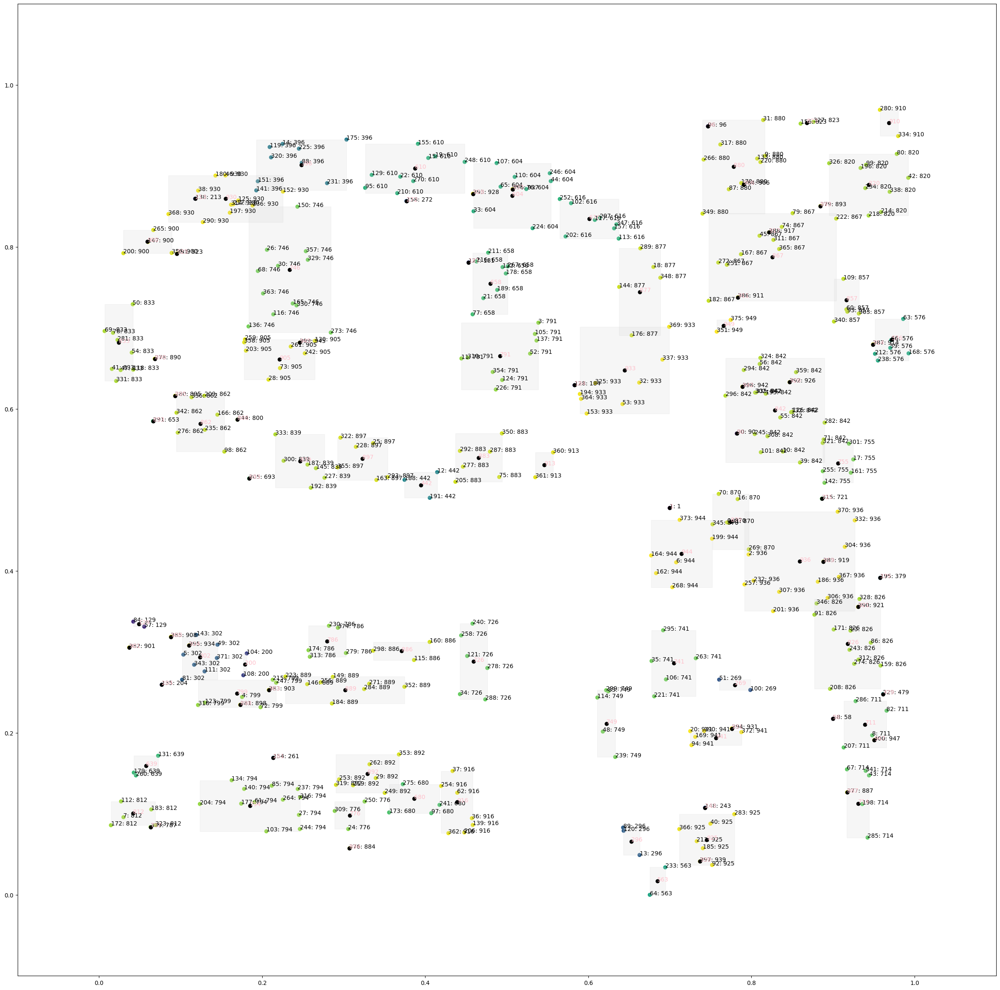

401 New DP: 950, [{0: 0.7535988037903566, 1: 0.8312364170337738}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 401.]
950 directly inserted DP: 867 [{0: 0.8256950609164451, 1: 0.7875289280469897}, extents=+/- {0: 0.07817020623999099, 1: 0.05402643171806165}, weight=13.0, time=Mean: 249.384615], 950, True
884 New MC 884
776 884
952 New MC merge: 776 + 884 -> 952 [{0: 0.3072608686676242, 1: 0.08630602055800295}, extents=+/- {0: 0.01827714549460141, 1: 0.02887988252569751}, weight=4.0, time=Mean: 258.5]
402 New DP: 953, [{0: 0.9364498880765386, 1: 0.31127635829662265}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 402.]
953 directly inserted DP: 826 [{0: 0.9177524766199409, 1: 0.3098079295154185}, extents=+/- {0: 0.04053059683665072, 1: 0.05544787077826724}, weight=12.0, time=Mean: 232.], 953, True
403 New DP: 955, [{0: 0.040364702377968034, 1: 0.8090807635829662}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 403.]
955 directly inserted DP: 900 [{0: 0.059359986551489

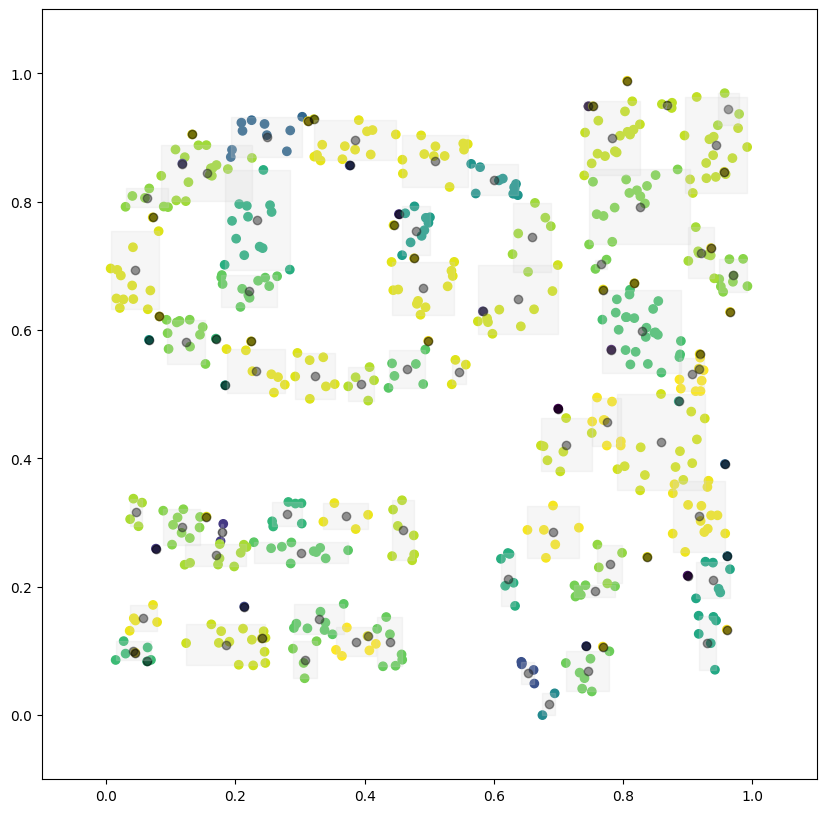

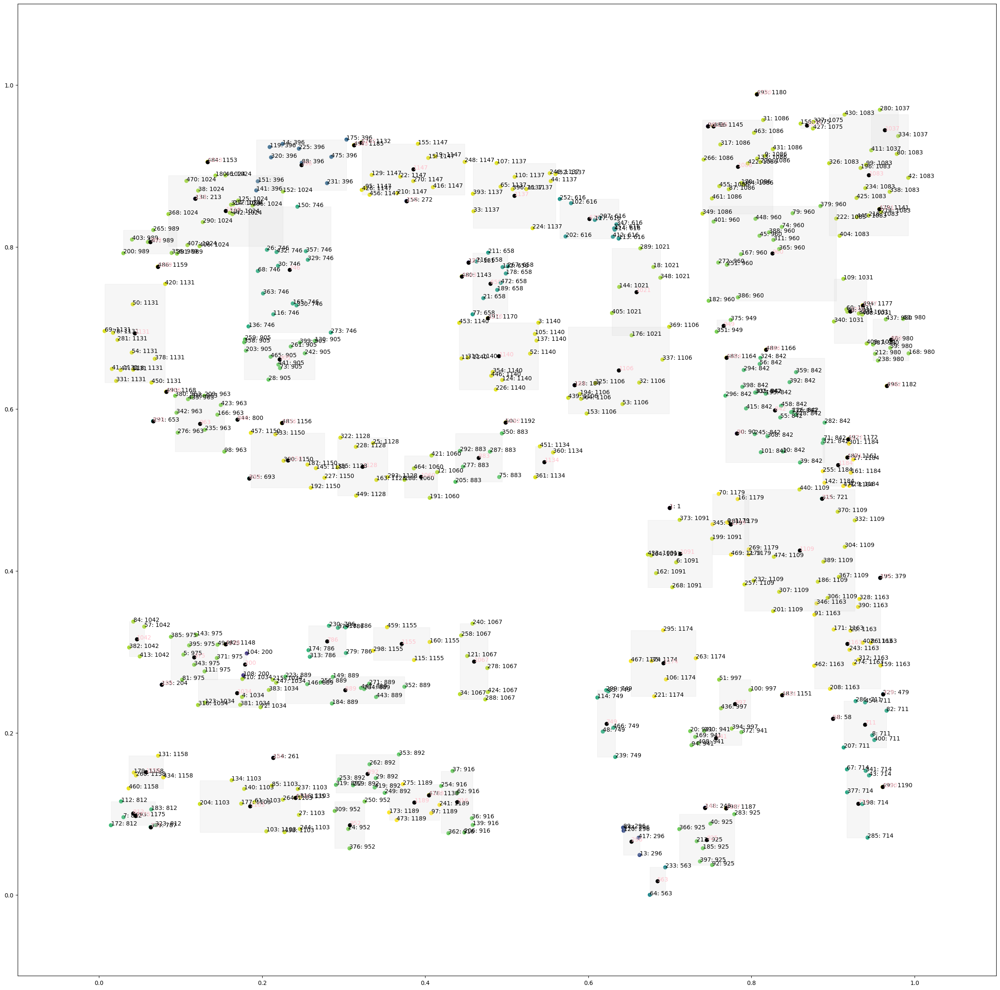

501 New DP: 1194, [{0: 0.05492360007196132, 1: 0.13182966226138032}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 501.]
1194 directly inserted DP: 1158 [{0: 0.05741349156961227, 1: 0.15157591776798826}, extents=+/- {0: 0.021235228020090192, 1: 0.020124522760646107}, weight=6.0, time=Mean: 327.5], 1194, True
1132 New MC 1132
396 1132
1196 New MC merge: 396 + 1132 -> 1196 [{0: 0.2570162296392201, 1: 0.9011289280469897}, extents=+/- {0: 0.06427488638072854, 1: 0.03136328928046994}, weight=11.0, time=Mean: 228.272727]
502 New DP: 1197, [{0: 0.25926575849895744, 1: 0.7341016152716593}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 502.]
1197 directly inserted DP: 746 [{0: 0.2336781971917386, 1: 0.7719624082232011}, extents=+/- {0: 0.05043633929177073, 1: 0.07764933920704847}, weight=14.0, time=Mean: 246.428571], 1197, True
503 New DP: 1199, [{0: 0.16518221847341708, 1: 0.6024505139500734}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 503.]
504 New DP: 1201, [{0: 0.942

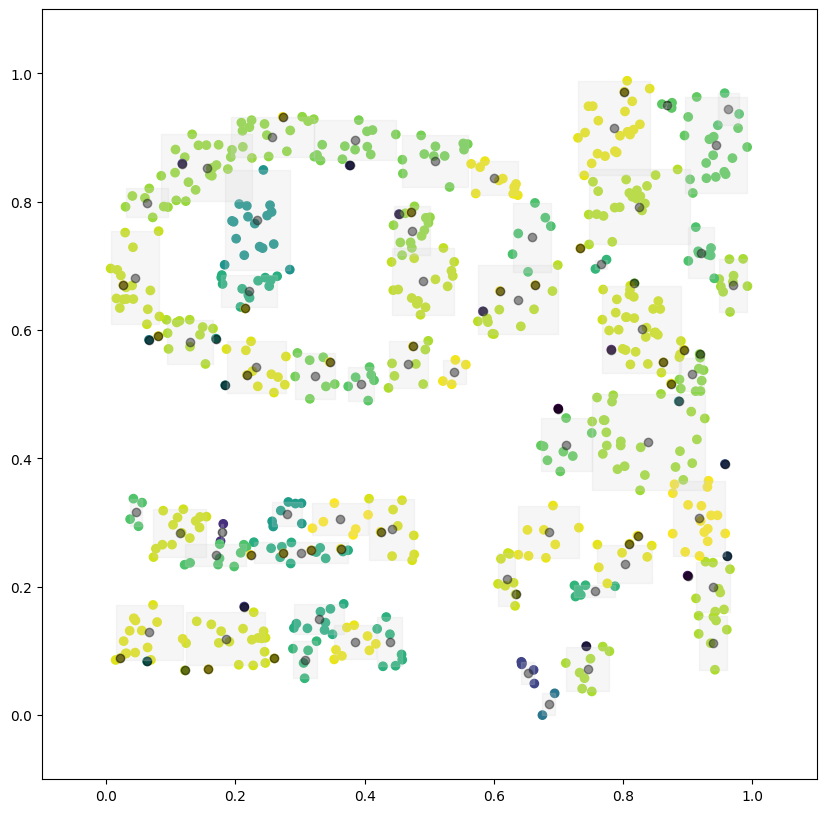

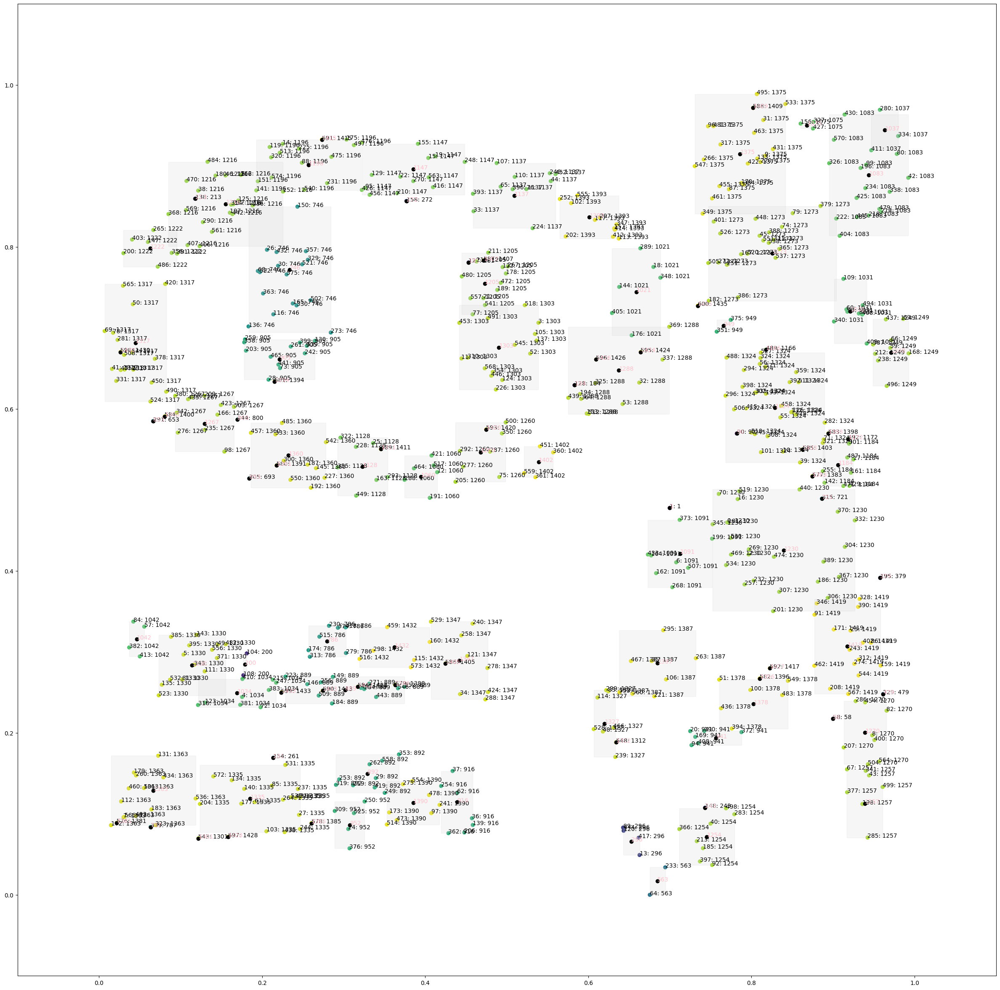

601 New DP: 1437, [{0: 0.03296359759460408, 1: 0.6158848751835535}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 601.]
1437 directly inserted DP: 1317 [{0: 0.044468562631425276, 1: 0.6816681350954479}, extents=+/- {0: 0.03773840876984466, 1: 0.07253098384728335}, weight=19.0, time=Mean: 337.368421], 1437, True
602 New DP: 1439, [{0: 0.09731590138938452, 1: 0.3191941262848752}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 602.]
1439 directly inserted DP: 1330 [{0: 0.11404912245517901, 1: 0.28357004405286346}, extents=+/- {0: 0.040977405912036115, 1: 0.03727107195301027}, weight=15.0, time=Mean: 325.], 1439, True
1383 New MC 1383
1184 1383
1441 New MC merge: 1184 + 1383 -> 1441 [{0: 0.8996994729717374, 1: 0.5309380323054331}, extents=+/- {0: 0.025142226849243998, 1: 0.026108663729809134}, weight=9.0, time=Mean: 324.666667]
603 New DP: 1442, [{0: 0.4553235163136924, 1: 0.9006919236417033}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 603.]
1385 New MC 1385
1335 138

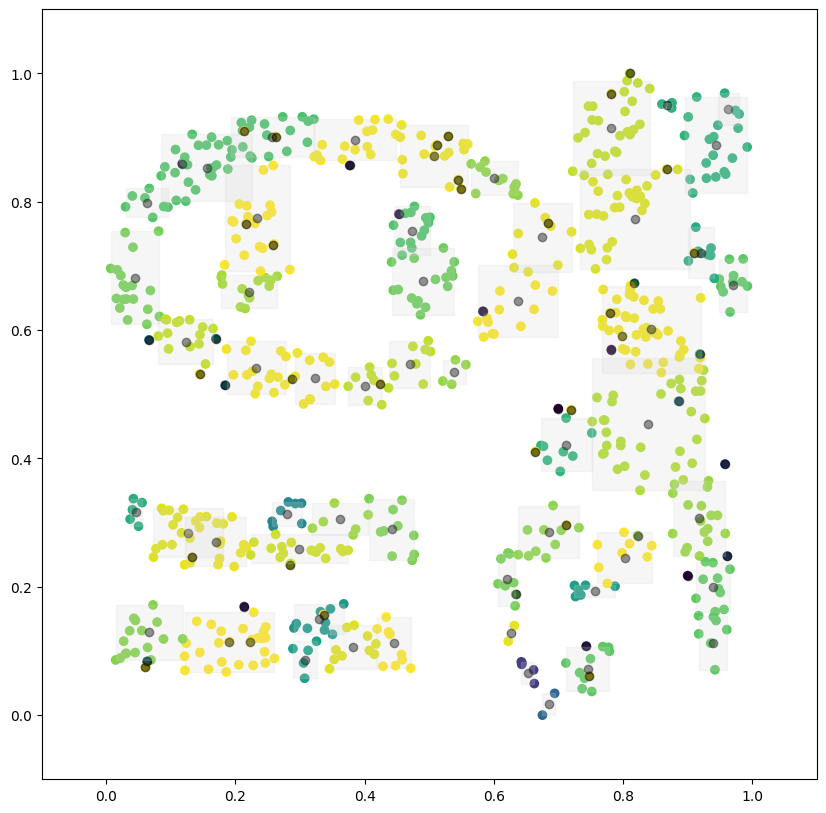

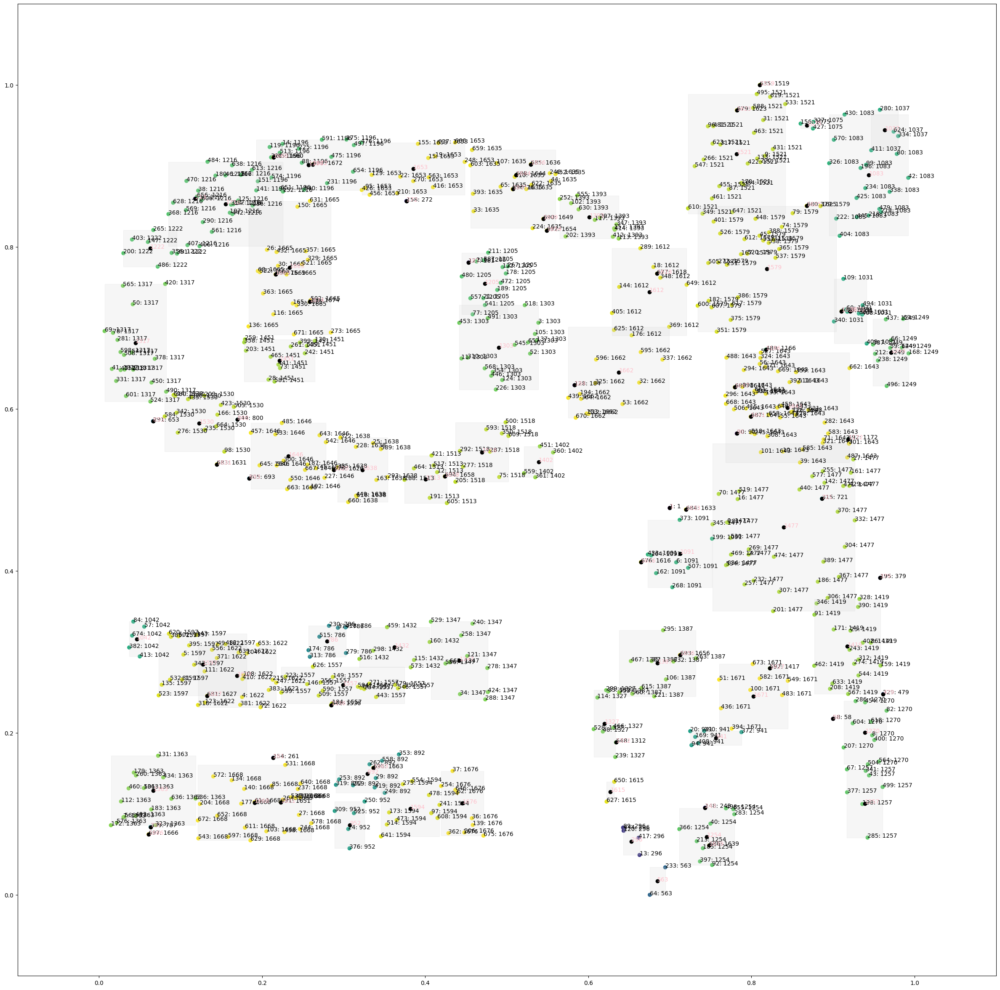

701 New DP: 1677, [{0: 0.1478112253775758, 1: 0.5272575624082232}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 701.]
1616 New MC 1616
1091 1616
1679 New MC merge: 1091 + 1616 -> 1679 [{0: 0.7080751524017094, 1: 0.42140029368575627}, extents=+/- {0: 0.043609597989801574, 1: 0.041533039647577125}, weight=9.0, time=Mean: 320.111111]
702 New DP: 1680, [{0: 0.5222667228987439, 1: 0.8399295154185021}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 702.]
1680 directly inserted DP: 1635 [{0: 0.5074903191367, 1: 0.8713997063142437}, extents=+/- {0: 0.05216680282300756, 1: 0.04829486049926579}, weight=18.0, time=Mean: 387.388889], 1680, True
703 New DP: 1682, [{0: 0.9099524878270332, 1: 0.3010960352422908}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 703.]
1682 directly inserted DP: 1419 [{0: 0.9176426176228576, 1: 0.30664434654919237}, extents=+/- {0: 0.040640455833733935, 1: 0.05861145374449339}, weight=17.0, time=Mean: 334.882353], 1682, True
1620 New MC 1620
1597 1622

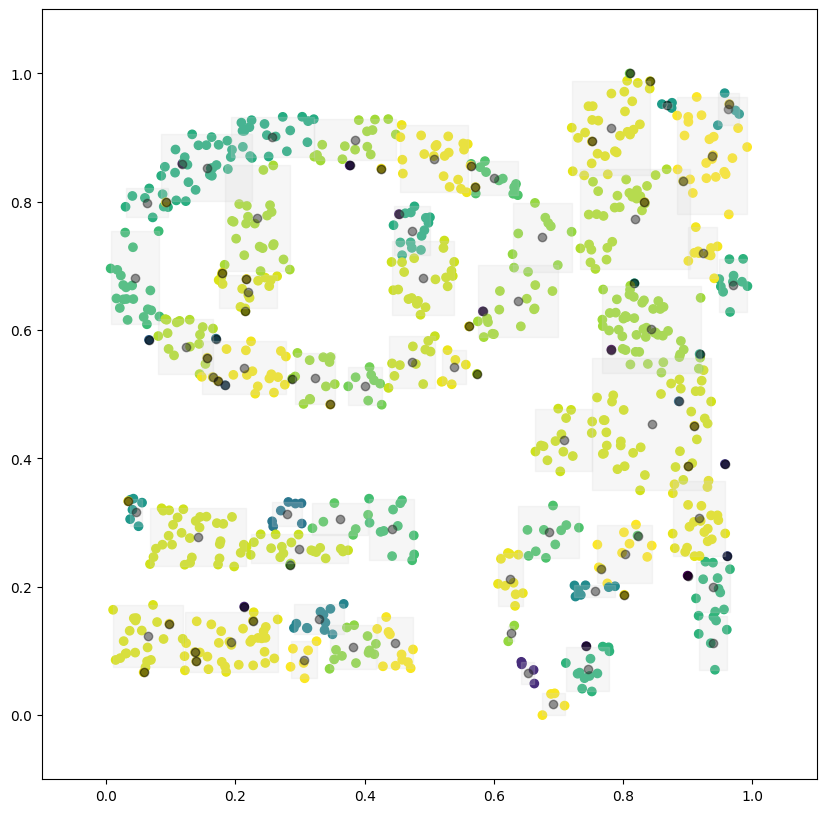

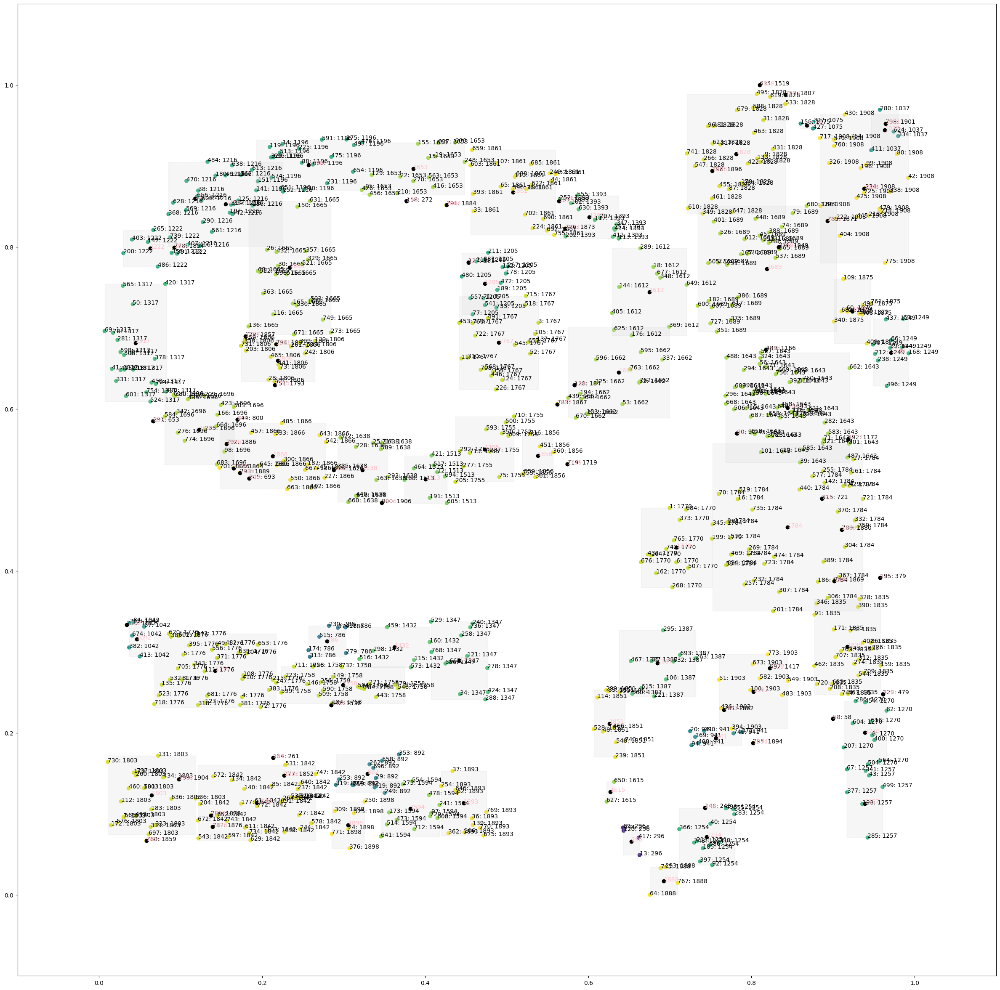

801 New DP: 1909, [{0: 0.5958073677784298, 1: 0.5941309838472834}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 801.]
1909 directly inserted DP: 1662 [{0: 0.6372116754308095, 1: 0.6452323054331864}, extents=+/- {0: 0.06186757345806626, 1: 0.05609867841409688}, weight=16.0, time=Mean: 442.375], 1909, True
802 New DP: 1911, [{0: 0.914575413408991, 1: 0.09332393538913362}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 802.]
803 New DP: 1913, [{0: 0.35477230432564266, 1: 0.29033773861967693}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 803.]
1913 directly inserted DP: 1432 [{0: 0.36227663232774254, 1: 0.3056834067547724}, extents=+/- {0: 0.04306472685661708, 1: 0.024750660792951518}, weight=7.0, time=Mean: 417.714286], 1913, True
804 New DP: 1915, [{0: 0.11129969829327782, 1: 0.13553245227606464}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 804.]
1915 directly inserted DP: 1803 [{0: 0.06440612733026417, 1: 0.12318707782672542}, extents=+/- {0: 0.05386998593

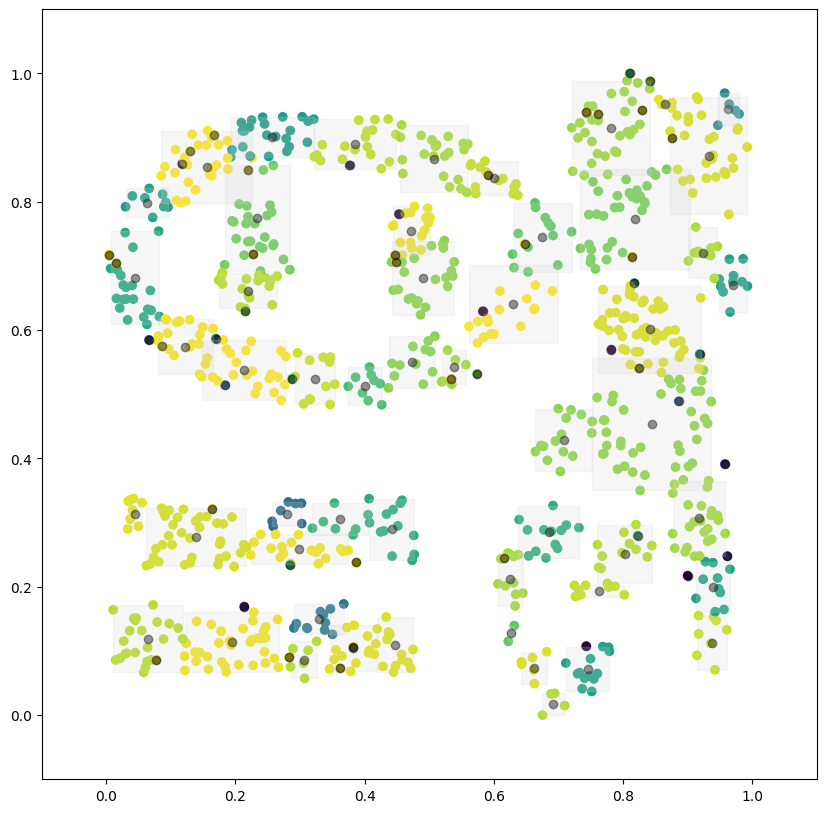

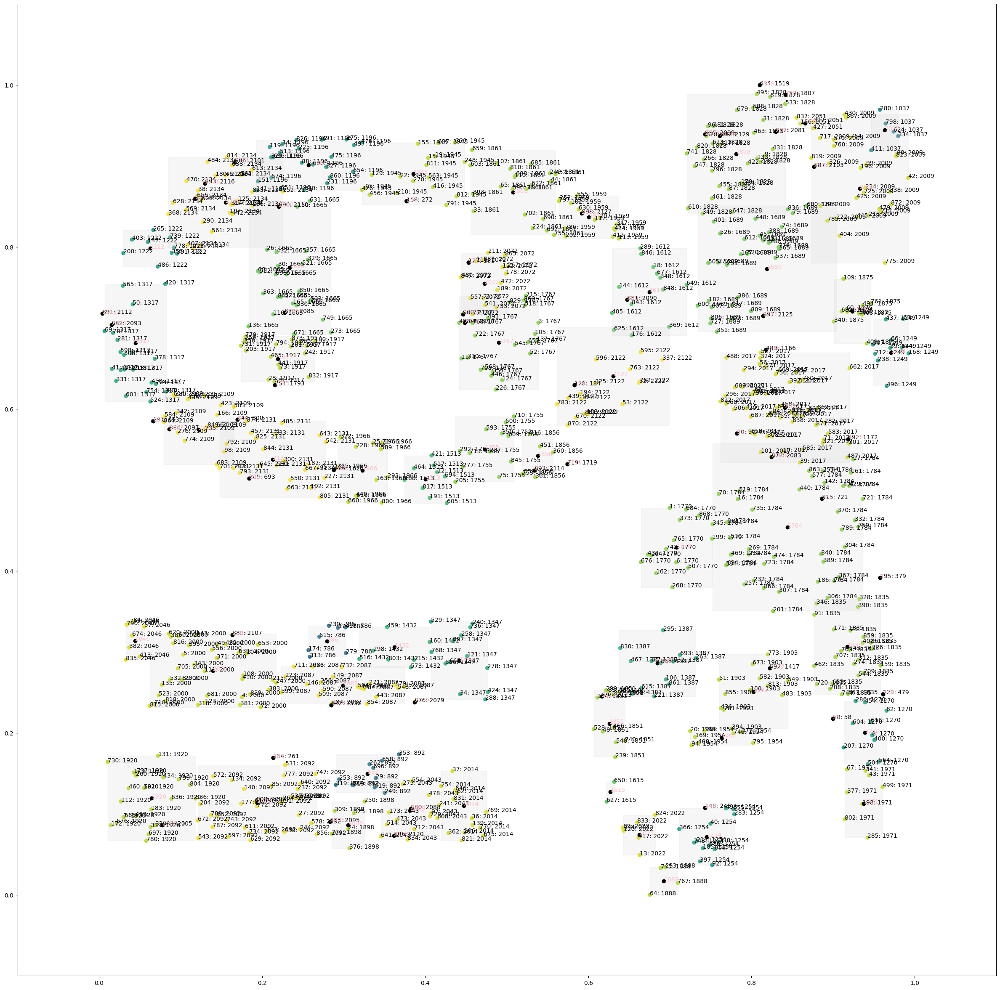

901 New DP: 2135, [{0: 0.7393687457789077, 1: 0.74527577092511}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 901.]
2135 directly inserted DP: 1689 [{0: 0.8189597458939277, 1: 0.7730161527165932}, extents=+/- {0: 0.08490552126250839, 1: 0.07762936857562408}, weight=35.0, time=Mean: 481.142857], 2135, True
2079 New MC 2079
2009 2051
2137 New MC merge: 2009 + 2051 -> 2137 [{0: 0.9237984080030437, 1: 0.8718613803230543}, extents=+/- {0: 0.06847607138327966, 1: 0.09148193832599116}, weight=30.0, time=Mean: 503.9]
902 New DP: 2138, [{0: 0.2319912348741119, 1: 0.717500146842878}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 902.]
2138 directly inserted DP: 1665 [{0: 0.2336781971917386, 1: 0.7743060205580028}, extents=+/- {0: 0.05043633929177073, 1: 0.08230014684287817}, weight=27.0, time=Mean: 475.62963], 2138, True
903 New DP: 2140, [{0: 0.24188296846383206, 1: 0.6574613803230542}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 903.]
2140 directly inserted DP: 1917 [{0

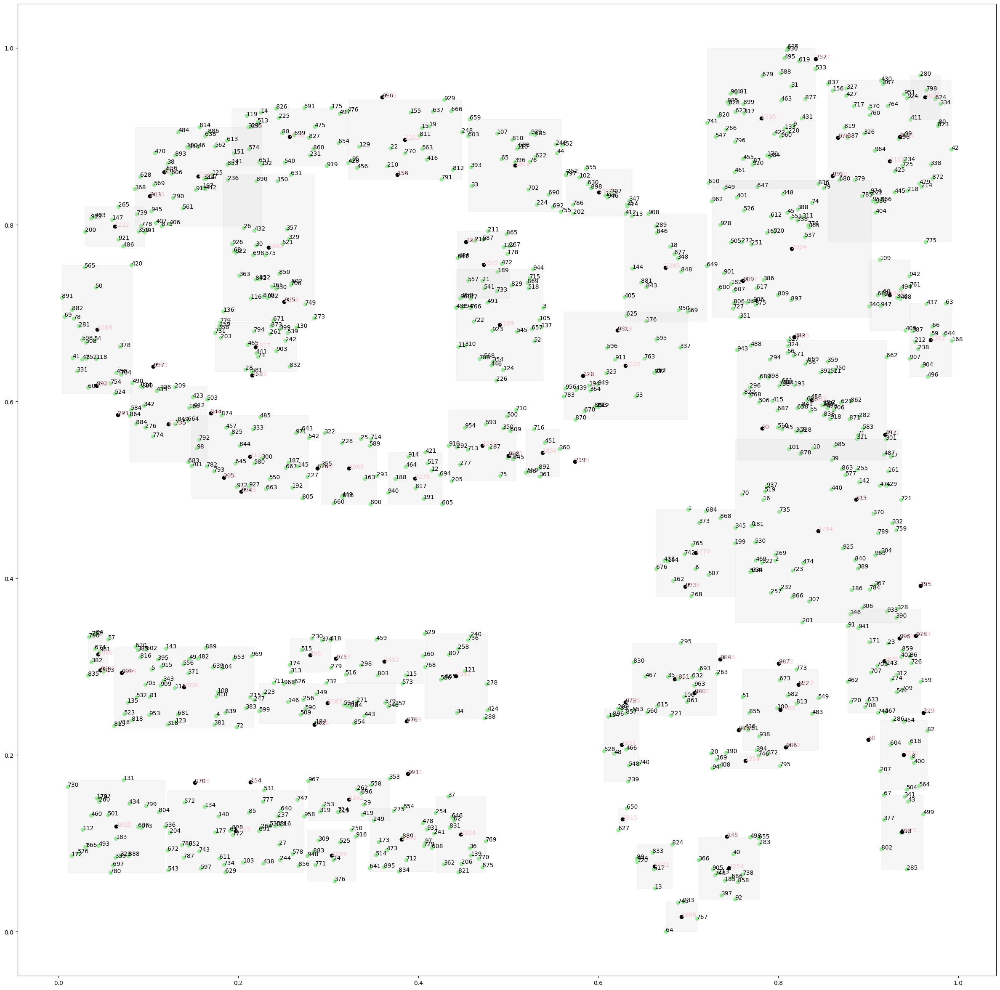

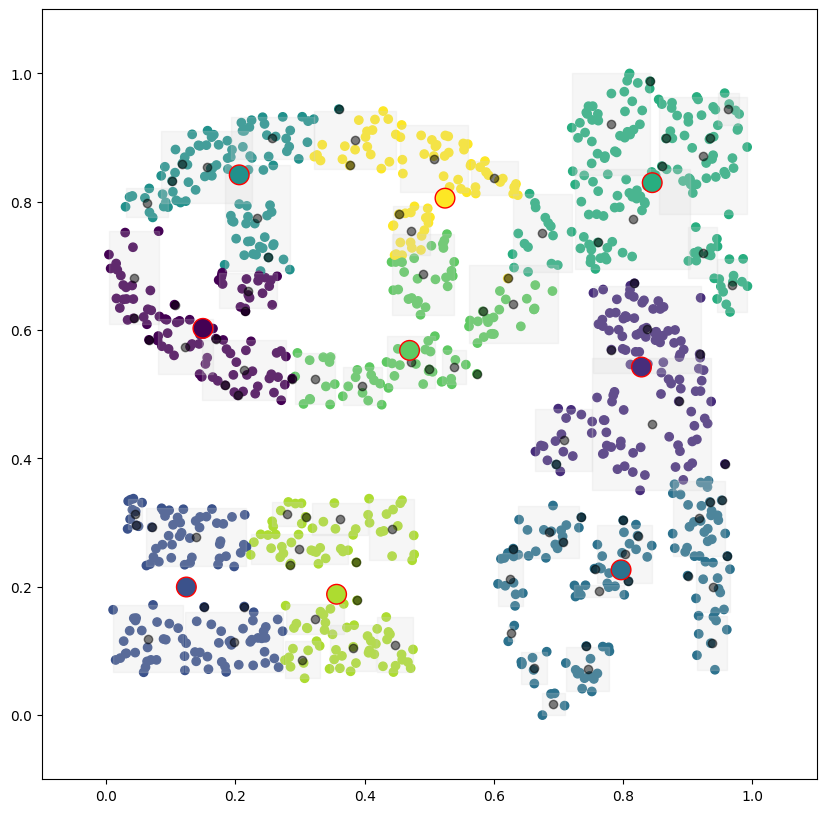

    0    1    2    3    4    5     6    7    8   
0    0    1    0    0    0    25    0    0    0  
1   20    0    0    0   27     0    0    0    0  
2    0    0    0    0    0     0   25    0   19  
3    0    0    0   57    0     0    0    0    0  
4    0   36    0   26    0     0    0    0    0  
5    0    0   52    0    0     0    0   51    0  
6   76    0    0    0   73    15   69    0   59  
7    0    0   63    0    0     0    0   51    0  
8    0   84    0   48    0   123    0    0    0  
{'accuracy': 0.458, 'ARI': 0.32329051905452577, 'NMI': 0.5946603193124935, 'AMI': 0.5879213930034639, 'completeness': 0.5571824294013938, 'fowl': 0.43119218791897573, 'homogeneity': 0.6375435583227799, 'purity': 0.655, 'F1': 0.41939828768036697, 'precision': 0.5462930794886047, 'recall': 0.34034240941950566, 'cluster_num': 9}
None


In [16]:
from method.offlineHandler import SCOPEOffline

scope = SCOPEOffline(n_macro_clusters=9, max_micro_clusters=100, max_singletons=25, sigma=0.5, mu=0.5, seed=0,
                     time_gap=10000, offline_datascale=1000)
i = 0
for x in X:
    dp = dict(enumerate(x))
    scope.learn_one(dp)
    if i % 100 == 0 and i > 0:
        scope.display_store()
    i += 1

plt.figure(figsize=(30, 30))
plt.scatter(X[:, 0], X[:, 1], c="lightgreen")
for i in range(len(X)):
    plt.text(X[i, 0], X[i, 1], i)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=1)
    plt.text(float(mccenter[0]), float(mccenter[1]), id, c="pink")

scope_labels_train = []

for x in X:
    dp = dict(enumerate(x))
    pred = scope.predict_one(dp)
    scope_labels_train.append(pred)

scope_centers = scope.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=scope_labels_train)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=0.5)
plt.scatter(scope_centers[:, 0], scope_centers[:, 1], c=range(len(scope_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, scope_labels_train))

-1 aged out
74 New MC 74
100 New DP: 100, [{0: 0.7985834825154613, 1: 0.252962114537445}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 100.]
-1 aged out
75 New MC 75
1 Parent merge: 0 -> 1 [{0: 0.49067304487850627, 1: 0.5158743024963289}, extents=+/- {0: 0.0, 1: 0.0}, weight=2.0, time=Mean: 99.]
101 New DP: 102, [{0: 0.8114967071793222, 1: 0.5464787077826725}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 101.]
-1 aged out
76 New MC 76
2 Parent merge: 1 -> 2 [{0: 0.523897649754771, 1: 0.8713961820851688}, extents=+/- {0: 0.0, 1: 0.0}, weight=3.0, time=Mean: 99.]
102 New DP: 104, [{0: 0.5787755366870065, 1: 0.8539348017621146}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 102.]
-1 aged out
77 New MC 77
3 Parent merge: 2 -> 3 [{0: 0.4580353377316255, 1: 0.716769456681351}, extents=+/- {0: 0.0, 1: 0.0}, weight=4.0, time=Mean: 99.]
103 New DP: 106, [{0: 0.20509421330635766, 1: 0.07844933920704845}, extents=+/- {0: 0.0, 1: 0.0}, weight=1.0, time=Mean: 103.]
-1 aged ou

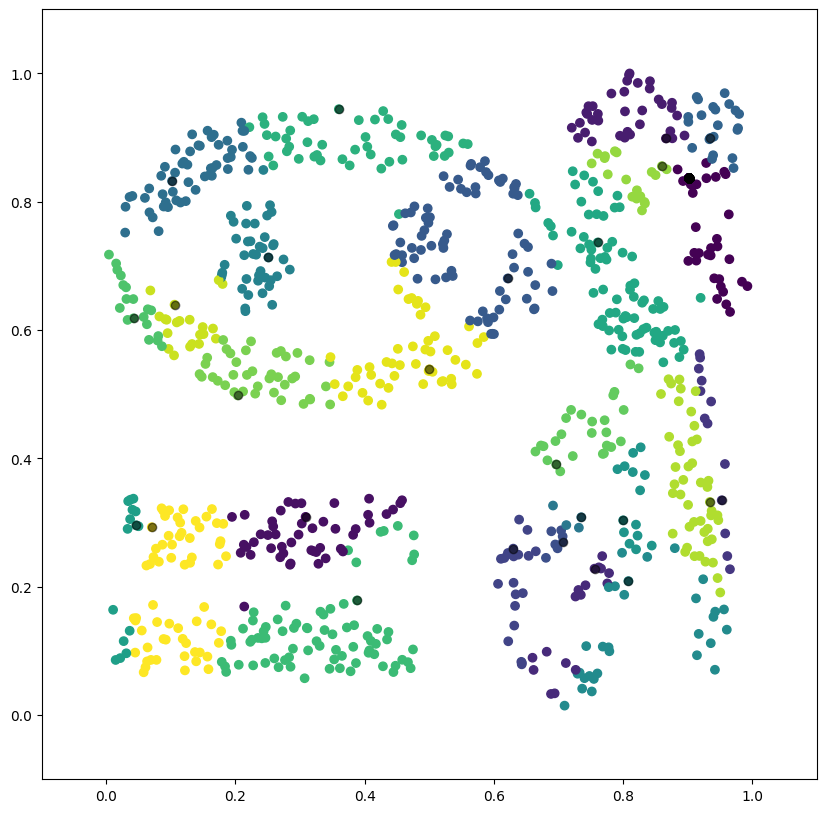

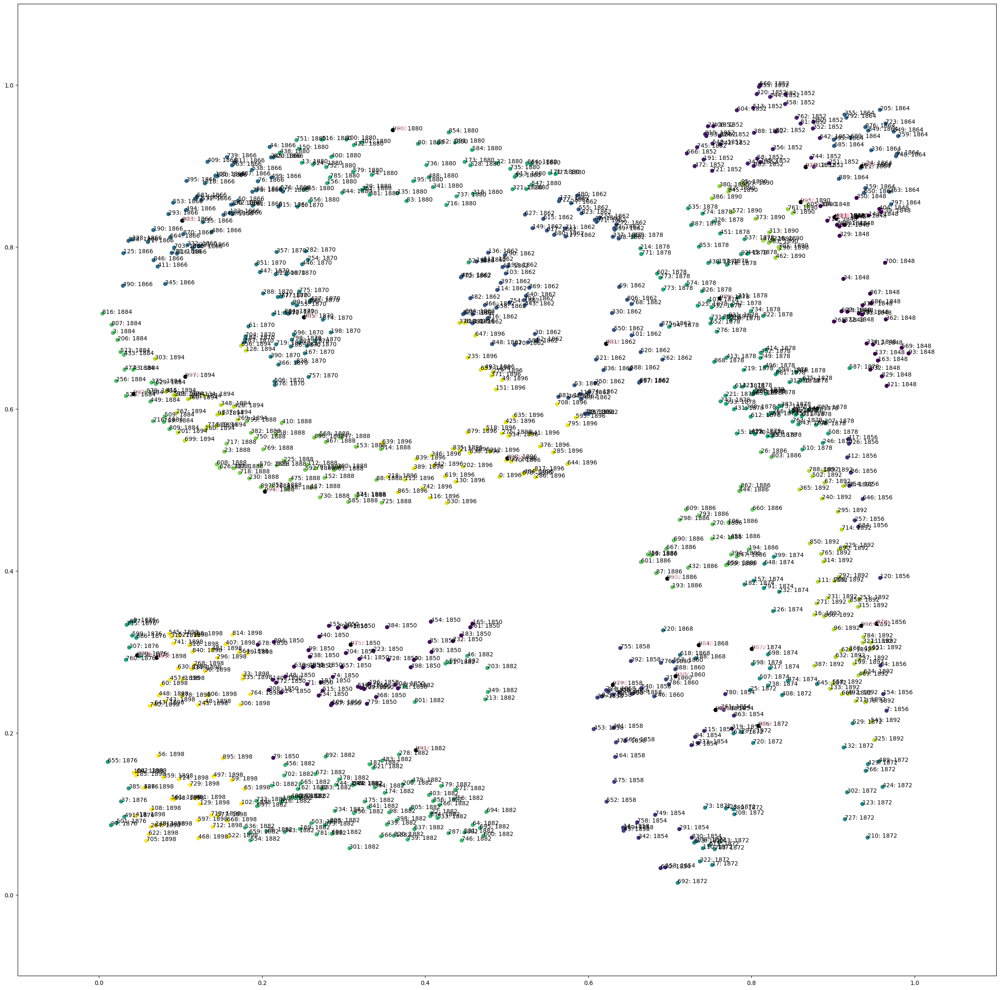

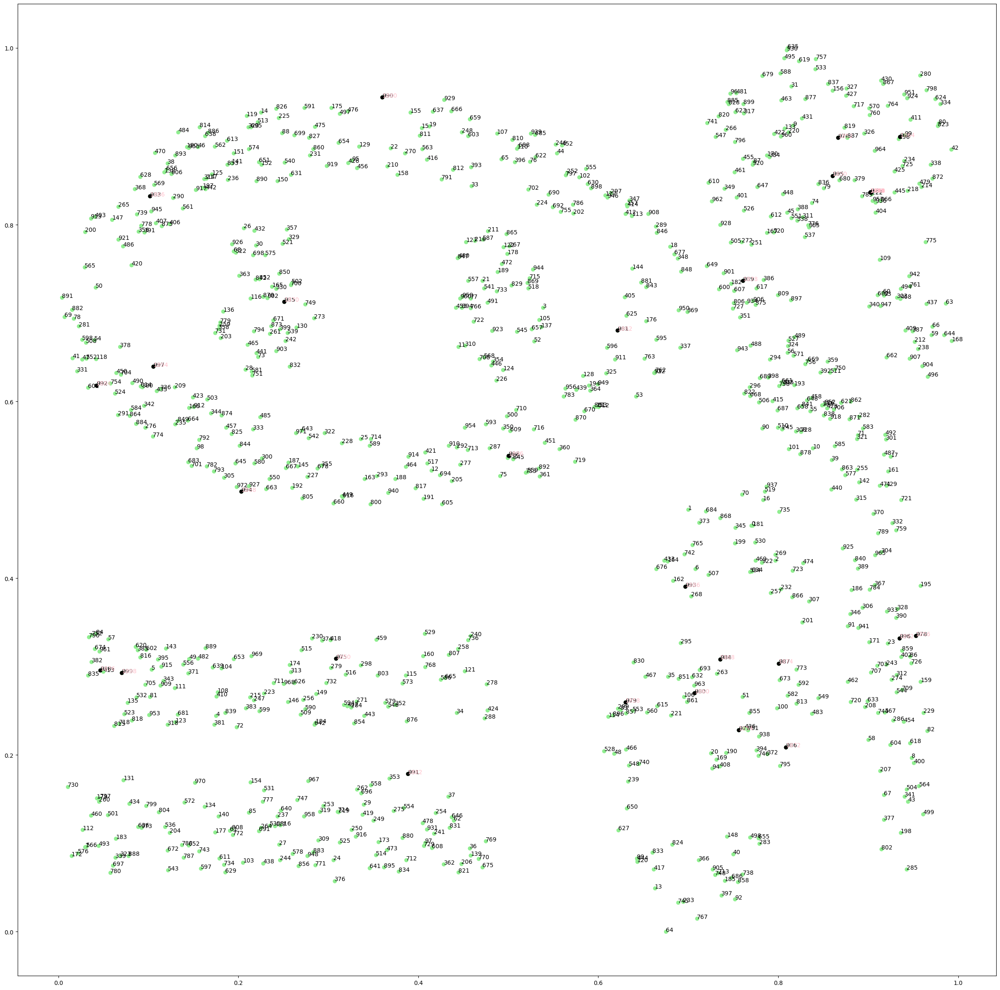

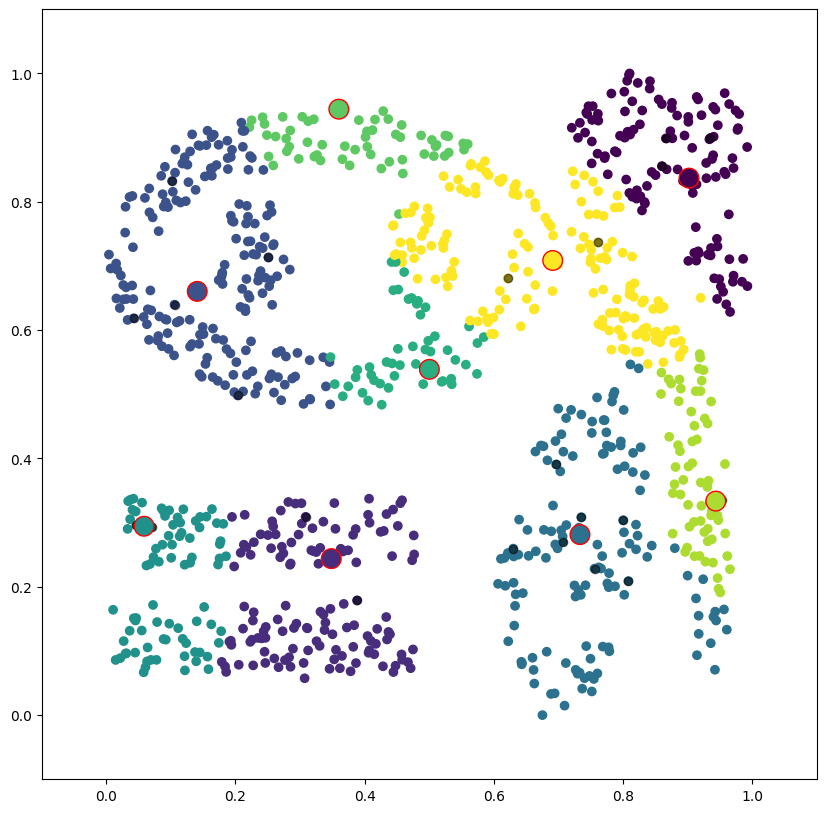

    0    1    2     3    4    5    6    7    8   
0   25    0     0    0    0    0    0    0    1  
1    0    0    47    0    0    0    0    0    0  
2    0    0     0    0    0   11    1    0   32  
3    0    0     0   57    0    0    0    0    0  
4    0    0     0   62    0    0    0    0    0  
5    0   57     0    0   46    0    0    0    0  
6    0    0   140    0    0   40   56    0   56  
7    0   76     0    0   38    0    0    0    0  
8   95    0     0   16    0    0    0   63   81  
{'accuracy': 0.451, 'ARI': 0.34401354803223794, 'NMI': 0.6199245096743765, 'AMI': 0.6134341197844924, 'completeness': 0.5899121163401616, 'fowl': 0.4511377068479456, 'homogeneity': 0.6531544211342009, 'purity': 0.659, 'F1': 0.44426517947317273, 'precision': 0.5377754540282028, 'recall': 0.37845764252629754, 'cluster_num': 9}
None


In [9]:
from method.offlineHandler import SCOPEOffline

scope = SCOPEOffline(n_macro_clusters=9, max_micro_clusters=100, max_singletons=25, sigma=0.5, mu=0.5, seed=0,
                     time_gap=10000, offline_datascale=1000, dissolve=True)
for x in X:
    dp = dict(enumerate(x))
    scope.learn_one(dp)

scope.display_store()

plt.figure(figsize=(30, 30))
plt.scatter(X[:, 0], X[:, 1], c="lightgreen")
for i in range(len(X)):
    plt.text(X[i, 0], X[i, 1], i)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=1)
    plt.text(float(mccenter[0]), float(mccenter[1]), id, c="pink")

scope_labels_train = []

for x in X:
    dp = dict(enumerate(x))
    pred = scope.predict_one(dp)
    scope_labels_train.append(pred)

scope_centers = scope.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=scope_labels_train)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=0.5)
plt.scatter(scope_centers[:, 0], scope_centers[:, 1], c=range(len(scope_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, scope_labels_train))

In [ ]:
from method.offlineHandler import SCOPEOffline

scope = SCOPEOffline(n_macro_clusters=9, max_micro_clusters=100, max_singletons=3, sigma=0.5, mu=0.5, seed=0,
                     time_gap=10000, offline_datascale=1000)
for x in X:
    dp = dict(enumerate(x))
    scope.learn_one(dp)

scope.display_store()

plt.figure(figsize=(30, 30))
plt.scatter(X[:, 0], X[:, 1], c="lightgreen")
for i in range(len(X)):
    plt.text(X[i, 0], X[i, 1], i)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=1)
    plt.text(float(mccenter[0]), float(mccenter[1]), id, c="pink")

scope_labels_train = []

for x in X:
    dp = dict(enumerate(x))
    pred = scope.predict_one(dp)
    scope_labels_train.append(pred)

scope_centers = scope.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=scope_labels_train)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=0.5)
plt.scatter(scope_centers[:, 0], scope_centers[:, 1], c=range(len(scope_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, scope_labels_train))

In [ ]:
print(scope.offline_dataset)

In [ ]:
ds_np = dps_to_np(scope.offline_dataset)
print(ds_np)
ds_opeclu = dps_to_np(genclustream.offline_dataset)
print(ds_opeclu)

In [ ]:
from similarity.BoP import BoP

bop = BoP(ref_data=X, n_prototype=100, cache_path="results")
truth_bop = bop.evaluate(X)
full_bop = bop.evaluate(X_test)
ope_clustream_bop = bop.evaluate(ds_opeclu)
scope_bop = bop.evaluate(ds_np)

print("JS", truth_bop['JS'], full_bop['JS'], ope_clustream_bop['JS'], scope_bop['JS'])
print("Hellinger", truth_bop['Hellinger'], full_bop['Hellinger'], ope_clustream_bop['Hellinger'],
      scope_bop['Hellinger'])
print("C2", truth_bop['C2'], full_bop['Hellinger'], ope_clustream_bop['C2'], scope_bop['C2'])

In [ ]:
from similarity.dataset_similarity_metrics import c2st_roc_auc

truth_c2st_roc = c2st_roc_auc(X, X)
full_c2st_roc = c2st_roc_auc(X, X_test)
ope_clustream_c2st_roc = c2st_roc_auc(X, ds_opeclu)
scope_c2st_roc = c2st_roc_auc(X, ds_np)

print("c2st ROC AUC", truth_c2st_roc, full_c2st_roc, ope_clustream_c2st_roc, scope_c2st_roc)

In [ ]:
from similarity.dataset_similarity_metrics import c2st_accuracy

truth_c2st_acc = c2st_accuracy(X, X)
full_c2st_acc = c2st_accuracy(X, X_test)
ope_clustream_c2st_acc = c2st_accuracy(X, ds_opeclu)
scope_c2st_acc = c2st_accuracy(X, ds_np)

print("c2st Accuracy", truth_c2st_acc, full_c2st_acc, ope_clustream_c2st_acc, scope_c2st_acc)

In [ ]:
from similarity.dataset_similarity_metrics import ks_test

truth_ks = ks_test(X, X)
full_ks = ks_test(X, X_test)
ope_clustream_ks = ks_test(X, ds_opeclu)
scope_ks = ks_test(X, ds_np)

print("KS", truth_ks[1], full_ks[1], ope_clustream_ks[1], scope_ks[1])
print("KS-full", truth_ks, full_ks, ope_clustream_ks, scope_ks)

In [ ]:
from similarity.dataset_similarity_metrics import zu_overfitting_statistic

truth_zu = zu_overfitting_statistic(X, X, X_test)
full_zu = zu_overfitting_statistic(X, X_test, X_test)
ope_clustream_zu = zu_overfitting_statistic(X, ds_opeclu, X_test)
scope_zu = zu_overfitting_statistic(X, ds_np, X_test)

print("RBF MMD", truth_zu, full_zu, ope_clustream_zu, scope_zu)

In [ ]:
import copy
from river import utils
from method.SCOPE import SCOPEMicroCluster


def _distance(point_a, point_b):
    return utils.math.minkowski_distance(point_a, point_b, 2)


def get_parent(mc_a: SCOPEMicroCluster, mc_b: SCOPEMicroCluster):
    parent = SCOPEMicroCluster(x=mc_a.x, w=mc_a.w, timestamp=mc_a.timestamp, var_time=copy.deepcopy(mc_a.var_time),
                               var_x=copy.deepcopy(mc_a.var_x))
    #parent.add_data(mc_a.weight)
    #print(mc_a, parent)
    parent += mc_b
    radius_a = _distance(mc_a.center, parent.center) + mc_a.radius()
    radius_b = _distance(mc_b.center, parent.center) + mc_b.radius()
    radius = max(radius_a, radius_b)
    parent.r = radius
    return parent


def get_half_parent(mc_a: SCOPEMicroCluster, mc_b: SCOPEMicroCluster):  # parent with only weights from mc_a
    actual_parent = get_parent(mc_a, mc_b)
    half_parent = SCOPEMicroCluster(x=actual_parent.center, w=mc_a.weight, timestamp=mc_a.timestamp,
                                    var_time=mc_a.var_time, r=actual_parent.r)
    return half_parent

In [ ]:
mc_a = SCOPEMicroCluster({0: 0, 1: 0}, w=1.0, r=0.1, timestamp=1)

mc_b = SCOPEMicroCluster({0: 1, 1: 0}, w=1.0, r=0.1, timestamp=2)

mc_a.insert({0: 0, 1: 0.0}, w=1.0, timestamp=4)

#mc_b.insert({0:0.7, 1:1}, w=1.0, timestamp=3)

print(mc_a)
print(mc_b)
mc_parent = get_parent(mc_a, mc_b)
print(mc_parent)

#mc_a.insert({0:0, 1:1}, w=1.0, timestamp=4)

print(mc_a)
print(mc_parent)

mc_half_parent = get_half_parent(mc_a, mc_b)
print(mc_half_parent)

In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000,
                            offline_datascale=1000, offline_algo="XMeans")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
xmeans = XMeans(random_state=0, allow_merging=True, check_global_score=False)
clustering = xmeans.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(xmeans.cluster_centers_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="DBHD", offline_args={"min_cluster_size": 50, "rho": 1.2, "beta": 0.2})
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
dbhd = DBHD(min_cluster_size=50, rho=1.2, beta=0.2)
clustering = dbhd.fit_predict(X)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="Spectral")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import SpectralClustering

spectral = SpectralClustering(n_clusters=9)
clustering = spectral.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
seed = 1
np.random.seed = seed
print(np.random.random_integers(100, size=10))

In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="DBSCAN", offline_args={"eps": 0.05, "min_samples": 10})
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.05, min_samples=10)
clustering = dbscan.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="OPTICS", offline_args={"min_samples": 10})
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import OPTICS

optics = OPTICS(min_samples=10)
clustering = optics.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="MeanShift")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
kmeans = KMeans(n_clusters=9, random_state=0)
clustering = kmeans.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(kmeans.cluster_centers_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="HDBSCAN")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
hdbscan = HDBSCAN(store_centers='centroid')
clustering = hdbscan.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(hdbscan.centroids_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import OPECluStream

genclustream = OPECluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="Agglomerative")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import AgglomerativeClustering

agglomerative = AgglomerativeClustering(n_clusters=9)
clustering = agglomerative.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))
